In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import dtale

In [2]:
data = pd.read_csv('../../datafiles/CS1_quora/train.csv')

In [3]:
data.info(),data.shape

&lt;class &#39;pandas.core.frame.DataFrame&#39;&gt;
RangeIndex: 404290 entries, 0 to 404289
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            404290 non-null  int64 
 1   qid1          404290 non-null  int64 
 2   qid2          404290 non-null  int64 
 3   question1     404289 non-null  object
 4   question2     404288 non-null  object
 5   is_duplicate  404290 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 18.5+ MB


(None, (404290, 6))

In [4]:
data.head()

,id,qid1,qid2,question1,question2,is_duplicate
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0


&lt;AxesSubplot:&gt;

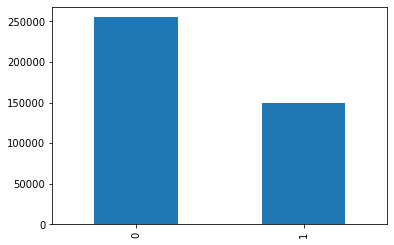

In [5]:
data['is_duplicate'].value_counts().plot.bar()

In [6]:
data['is_duplicate'].value_counts(),data['is_duplicate'].value_counts(normalize=True)

(0    255027
 1    149263
 Name: is_duplicate, dtype: int64,
 0    0.630802
 1    0.369198
 Name: is_duplicate, dtype: float64)

In [7]:
d= dtale.show(data)
# print(d._main_url)

In [8]:
dtale.show(data)

http://LAPTOP-M9DIN7JD:40000/dtale/main/1
It looks like this data may have already been loaded to D-Tale based on shape and column names. Here is URL of the data that seems to match it:

None

If you still want to load this data please use the following command:

dtale.show(df, ignore_duplicate=True)


In [9]:
lst1 = list(data['qid1'])
lst2 = list(data['qid2'])
lst1.extend(lst2)
qidlst = pd.Series(lst1)

Those are the total no. of unique questions asked

In [10]:
qidlst.nunique()

537933

In [11]:
qidlst.value_counts()

2559      157
30782     120
4044      111
2561       88
14376      79
         ... 
75109       1
81254       1
85352       1
83305       1
168274      1
Length: 537933, dtype: int64

No of questions appeared more than once, appeared only once

In [12]:
sum(qidlst.value_counts()>1),sum(qidlst.value_counts()==1)

(111780, 426153)

Checking duplicate rows

In [13]:
data[data[['qid1','qid2']].duplicated()]

,id,qid1,qid2,question1,question2,is_duplicate


There are no duplicate rows

> Plotting frequency of questions

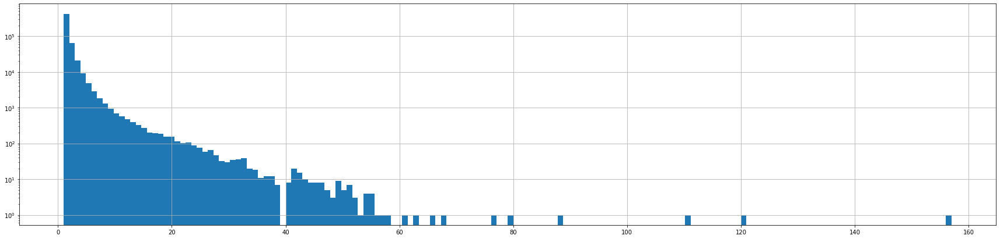

In [14]:
qidlst.value_counts().hist(bins=160)
ax = plt.gca()
fig = plt.gcf()
fig.set_size_inches((30,7))
# ax.set_xlim(1,10)
ax.set_yscale('log')

Checking Null/nan Values

In [15]:
data.isna().sum()

id              0
qid1            0
qid2            0
question1       1
question2       2
is_duplicate    0
dtype: int64

In [16]:
data.isnull().sum()

id              0
qid1            0
qid2            0
question1       1
question2       2
is_duplicate    0
dtype: int64

In [17]:
data[data.isna().any(1)]

,id,qid1,qid2,question1,question2,is_duplicate
105780,105780,174363,174364,How can I develop android app?,NaN,0
201841,201841,303951,174364,How can I create an Android app?,NaN,0
363362,363362,493340,493341,NaN,My Chinese name is Haichao Yu. What English na...,0


In [18]:
data.fillna('',inplace=True)
data.isna().sum()

id              0
qid1            0
qid2            0
question1       0
question2       0
is_duplicate    0
dtype: int64

> - ### Feature Engineering

Let us now construct a few features like:
 - ____freq_qid1____ = Frequency of qid1's
 - ____freq_qid2____ = Frequency of qid2's 
 - ____q1len____ = Length of q1
 - ____q2len____ = Length of q2
 - ____q1_n_words____ = Number of words in Question 1
 - ____q2_n_words____ = Number of words in Question 2
 - ____word_Common____ = (Number of common unique words in Question 1 and Question 2)
 - ____word_Total____ =(Total num of words in Question 1 + Total num of words in Question 2)
 - ____word_share____ = (word_common)/(word_Total)
 - ____freq_q1+freq_q2____ = sum total of frequency of qid1 and qid2 
 - ____freq_q1-freq_q2____ = absolute difference of frequency of qid1 and qid2 

In [19]:
# Creating the frequency count on quyseion ID's
feq_dic = dict(qidlst.value_counts())
data_fet = pd.DataFrame()

In [20]:
data_fet['q1_feq'] = data['qid1'].map(feq_dic)
data_fet['q2_feq'] = data['qid2'].map(feq_dic)
data_fet['q1_len'] = data['question1'].apply(len)
data_fet['q2_len'] = data['question2'].apply(len)
data_fet['q1_wrdcnt'] = data['question1'].apply(lambda x: len(list(x.split())))
data_fet['q2_wrdcnt'] = data['question2'].apply(lambda x: len(list(x.split())))
data_fet['comm_wrds'] = data.apply(lambda x: len(set(x['question1'].lower().split()).intersection(set(x['question2'].lower().split()))),axis=1)
data_fet['tot_wrtcnt'] = data_fet['q1_wrdcnt'] + data_fet['q2_wrdcnt']
data_fet['wrd_share'] = data_fet['comm_wrds'] / data_fet['tot_wrtcnt']
data_fet['add_feq'] = data_fet['q1_feq'] + data_fet['q2_feq']
data_fet['sub_feq'] = abs(data_fet['q1_feq'] - data_fet['q2_feq'])
data = pd.concat([data,data_fet],axis=1)

Analysis of extracted features

&lt;AxesSubplot:xlabel=&#39;is_duplicate&#39;, ylabel=&#39;sub_feq&#39;&gt;

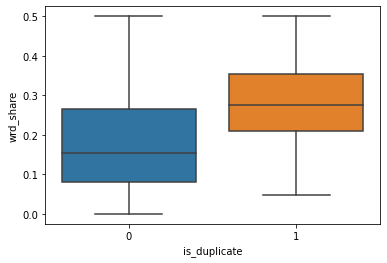

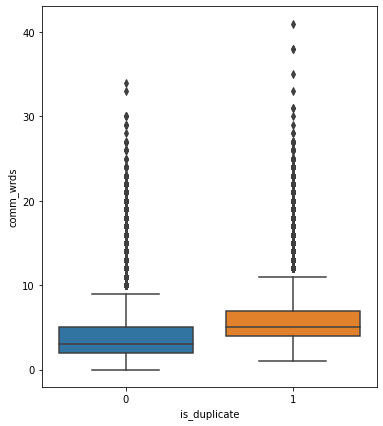

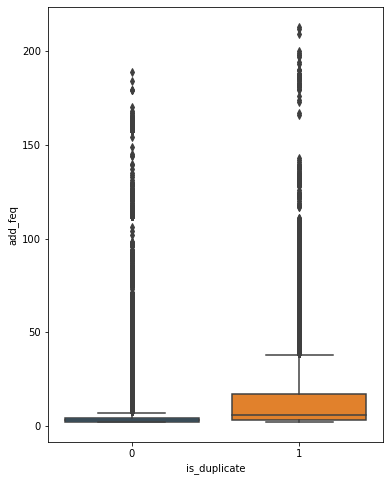

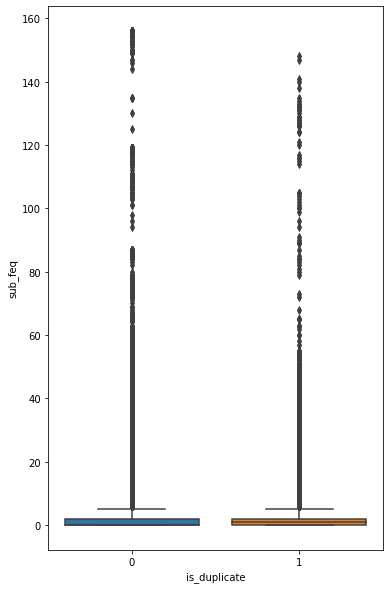

In [21]:
sns.boxplot(data = data,y='wrd_share',x='is_duplicate')
plt.figure(figsize=(6,7))
sns.boxplot(data = data,y='comm_wrds',x='is_duplicate')
plt.figure(figsize=(6,8))
sns.boxplot(data = data,y='add_feq',x='is_duplicate')
plt.figure(figsize=(6,10))
sns.boxplot(data = data,y='sub_feq',x='is_duplicate')

&lt;AxesSubplot:xlabel=&#39;wrd_share&#39;, ylabel=&#39;Count&#39;&gt;

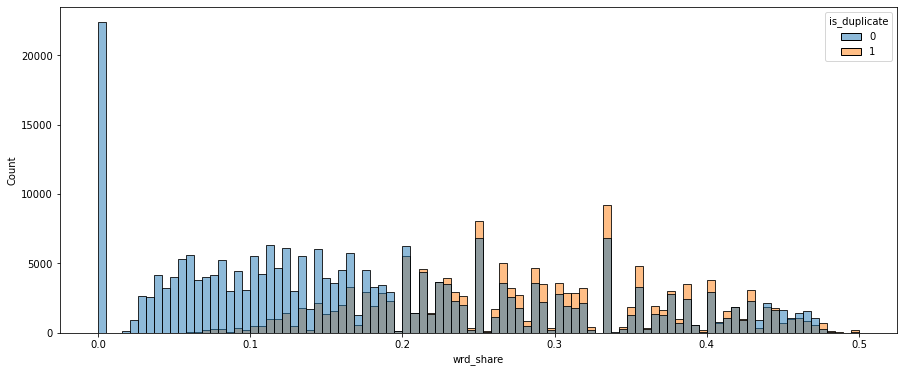

In [29]:
plt.figure(figsize=(15,6))
sns.histplot(x=data['wrd_share'],hue=data['is_duplicate'])

&lt;AxesSubplot:xlabel=&#39;comm_wrds&#39;, ylabel=&#39;Count&#39;&gt;

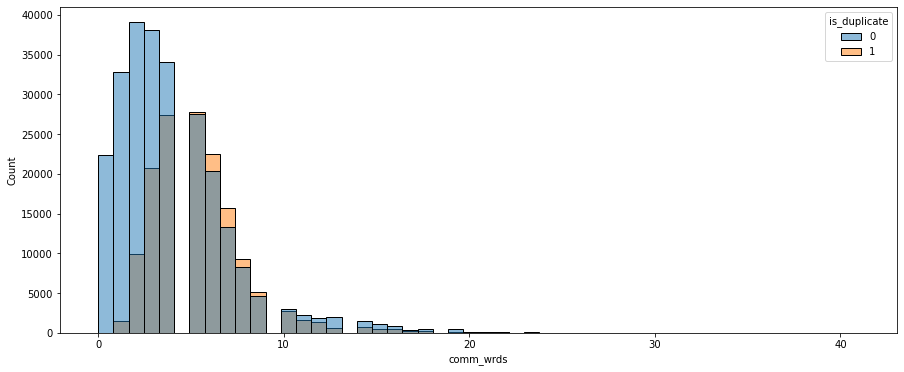

In [33]:
plt.figure(figsize=(15,6))
sns.histplot(x=data['comm_wrds'],hue=data['is_duplicate'],bins=40)